# TODO
    -> add in fits processing a save of png files with transformations to make LSB galaxies pop up.
       ^ maybe do this after aplying the filter? LSBs might be more visible then

# Imports

In [1]:
import pandas as pd
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import glob
from sklearn.cluster import DBSCAN
from mask import get_mask
from img_processing import fits_processing
from utils import download_fields
from config import IMAGES_DIR

# Download Data

In [2]:
download_fields()

establishing connection to splus ...
Login: welberth
Password: ········


  0%|          | 0/2 [00:00<?, ?it/s]

You have access to internal data


100%|██████████| 2/2 [01:02<00:00, 31.50s/it]


# Image Processing

In [38]:
fits_processing(Q = 8, stretch = 3)

100%|██████████| 2/2 [00:47<00:00, 23.75s/it]


# Load Images

In [6]:
field = "STRIPE82-0113"

In [18]:
DATA_DIR ="data/fits/"
fits_files = glob.glob(DATA_DIR+"*")
fits_files

['data/fits/STRIPE82-0113_band_R.fits',
 'data/fits/STRIPE82-0113_band_G.fits',
 'data/fits/SPLUS-s28s34_band_I.fits',
 'data/fits/STRIPE82-0113_band_I.fits',
 'data/fits/SPLUS-s28s34_band_G.fits',
 'data/fits/SPLUS-s28s34_band_R.fits']

In [21]:
fields = set([f.replace(DATA_DIR,"").split("_")[0] for f in fits_files])

{'SPLUS-s28s34', 'STRIPE82-0113'}

In [37]:
from  tqdm import tqdm
from astropy.io import fits
from astropy.visualization import make_lupton_rgb
def crop_image(img:np.array, tol:float = 30)->np.array:
    """
    removes black borders from images
    """
    mask = np.where(img[:, :, 0] > tol)
    min_row, min_col = [np.min(m) for m in mask] 
    max_row, max_col = [np.max(m) for m in mask] 
    return img[ min_row:max_row, min_col:max_col]

def fits_2_rgb(fits, Q = 8, stretch = 3)-> np.array:
    """
    converts fits data to rgb images using luption transformation
    """
    g,b,r =  fits
    return make_lupton_rgb(r,g,b , Q = Q, stretch = stretch)

def fits_processing(load_path = DATA_DIR, save_path = IMAGES_DIR, Q = 8, stretch = 3, bands:list=['R','G','I']) -> None:
    """
    performs fits preprocessing (fits2rgb + saving)
    """
    fits_files = glob.glob(load_path+"*")
    fields = set([f.replace(DATA_DIR,"").split("_")[0] for f in fits_files])
    
    for field in tqdm(fields):
        fits_data = [fits.open(DATA_DIR+f"{field}_band_{band}.fits", memmap=False)[0].data for band in bands]
        rgb = fits_2_rgb(fits_data, Q = Q, stretch = stretch)
        np.savez(save_path + f'{field}_rgb.npz', img = np.flipud(rgb)) # flipud to make it easier to compare to legacy images

In [39]:
files = glob.glob(IMAGES_DIR+"*.npz")
data = [np.load(file)['img'] for file in files]

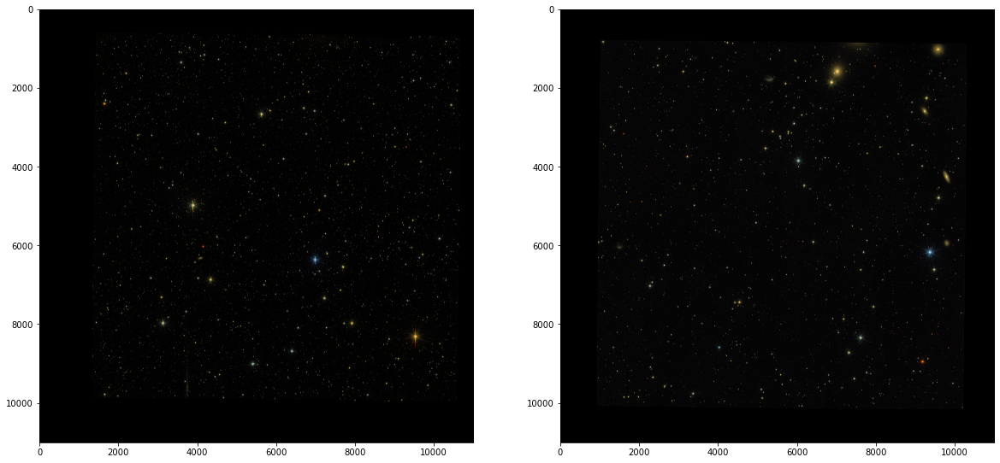

In [40]:
fig,ax = plt.subplots(1,2,figsize=(20,10))
for i in range(2):
    ax[i].imshow(data[i])

# Mask

In [41]:
mask = get_mask(data[1][:,:,0],pixel_threshold=200)

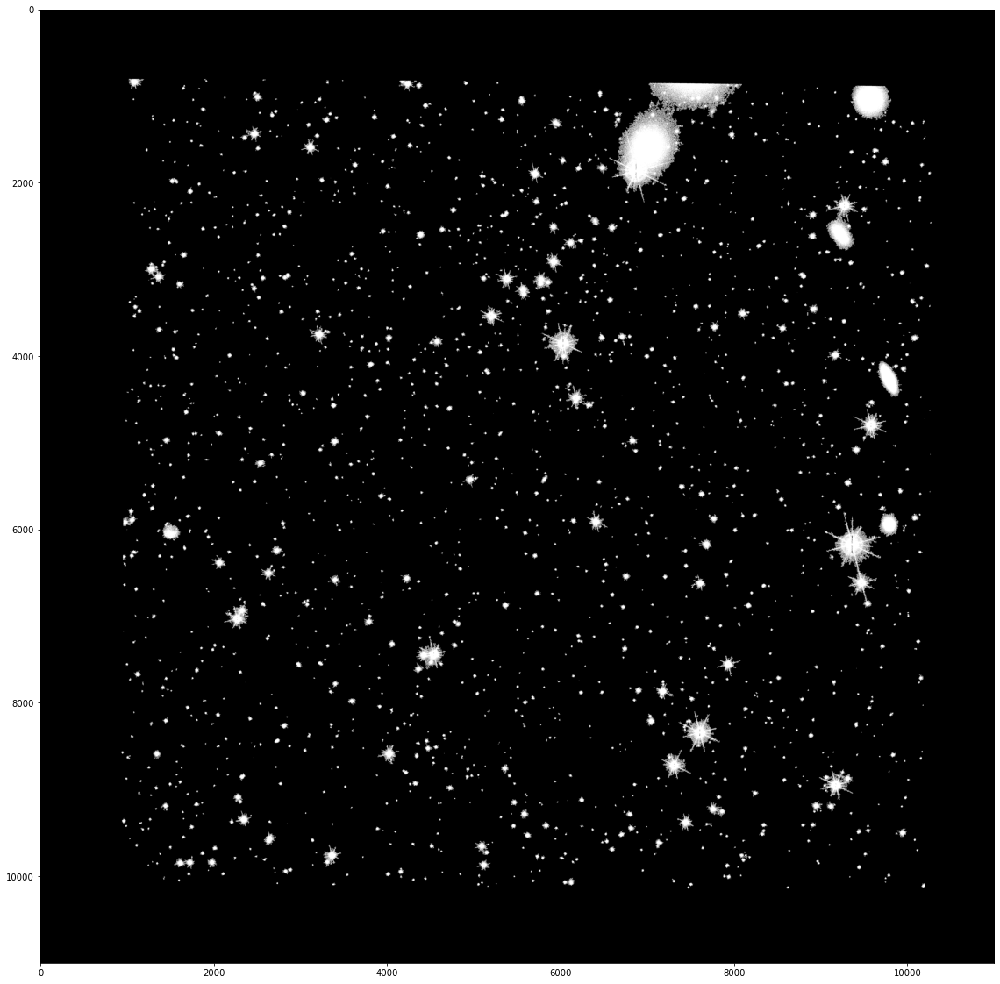

In [42]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(mask, cmap='gray_r');
plt.imsave(fname='data/images/SPLUS-s28s34_mask.png', arr=mask, cmap='gray_r', format='png')

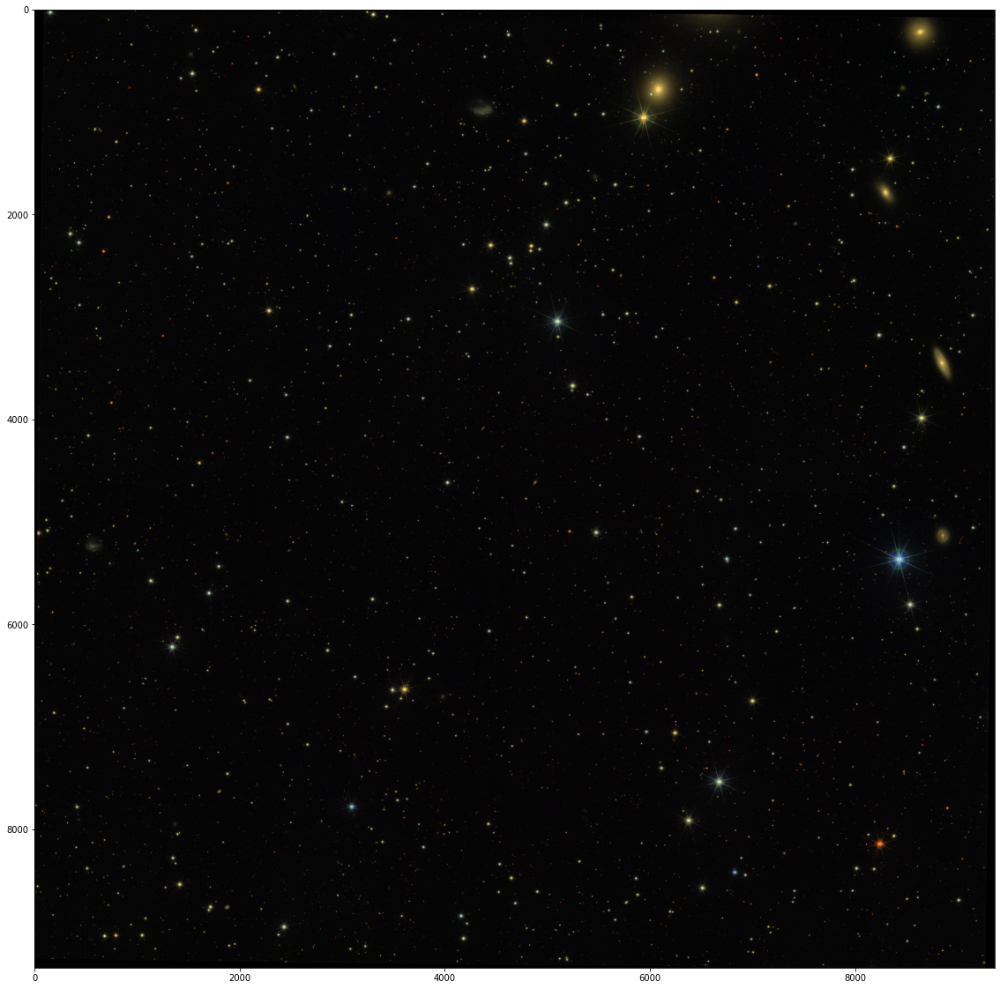

In [16]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(data[1]);
plt.imsave(fname='data/images/SPLUS-s28s34_band_r.png', arr=data[1][:,:,1], cmap='gray_r', format='png')

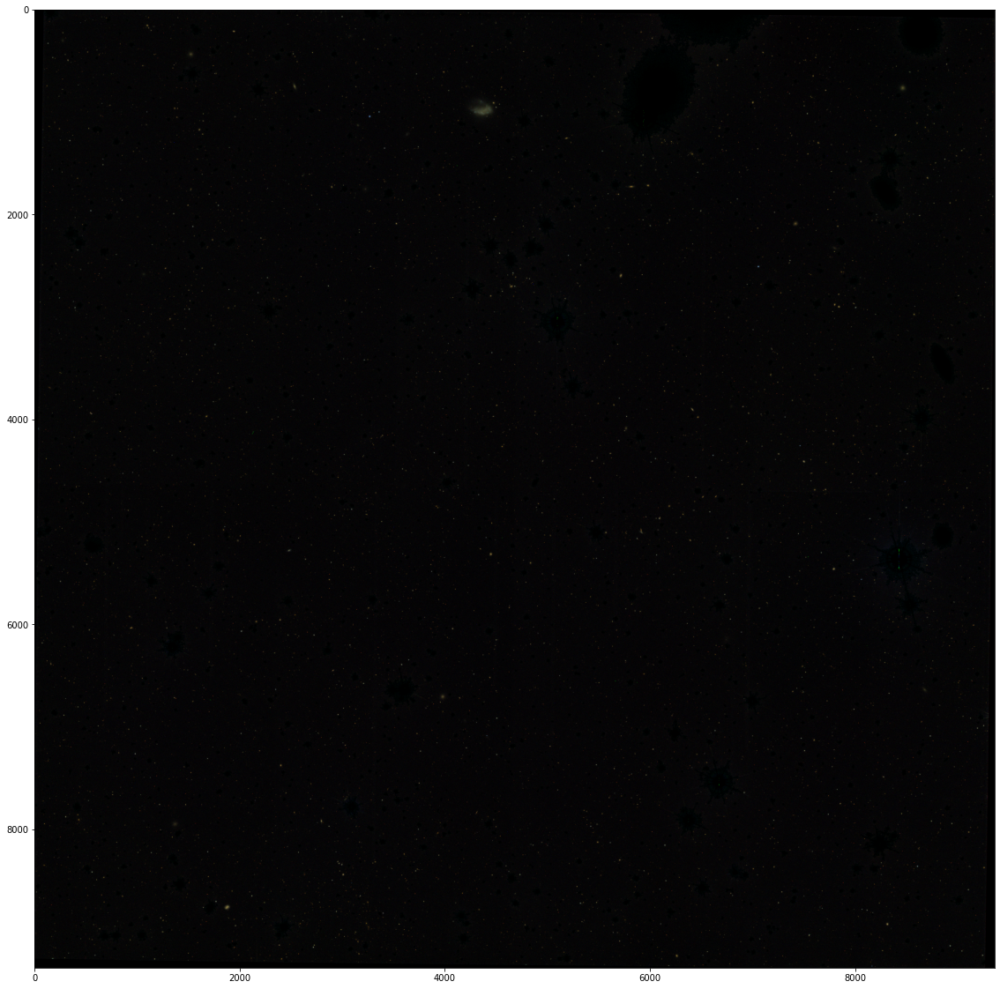

In [15]:
fig,ax = plt.subplots(figsize=(20,20))
masked_data = data[1]*np.dstack([mask]*3)
plt.imshow(masked_data);
plt.imsave(fname='data/images/SPLUS-s28s34_band_r_masked.png', arr=data[1][:,:,1]*mask, cmap='gray_r', format='png')

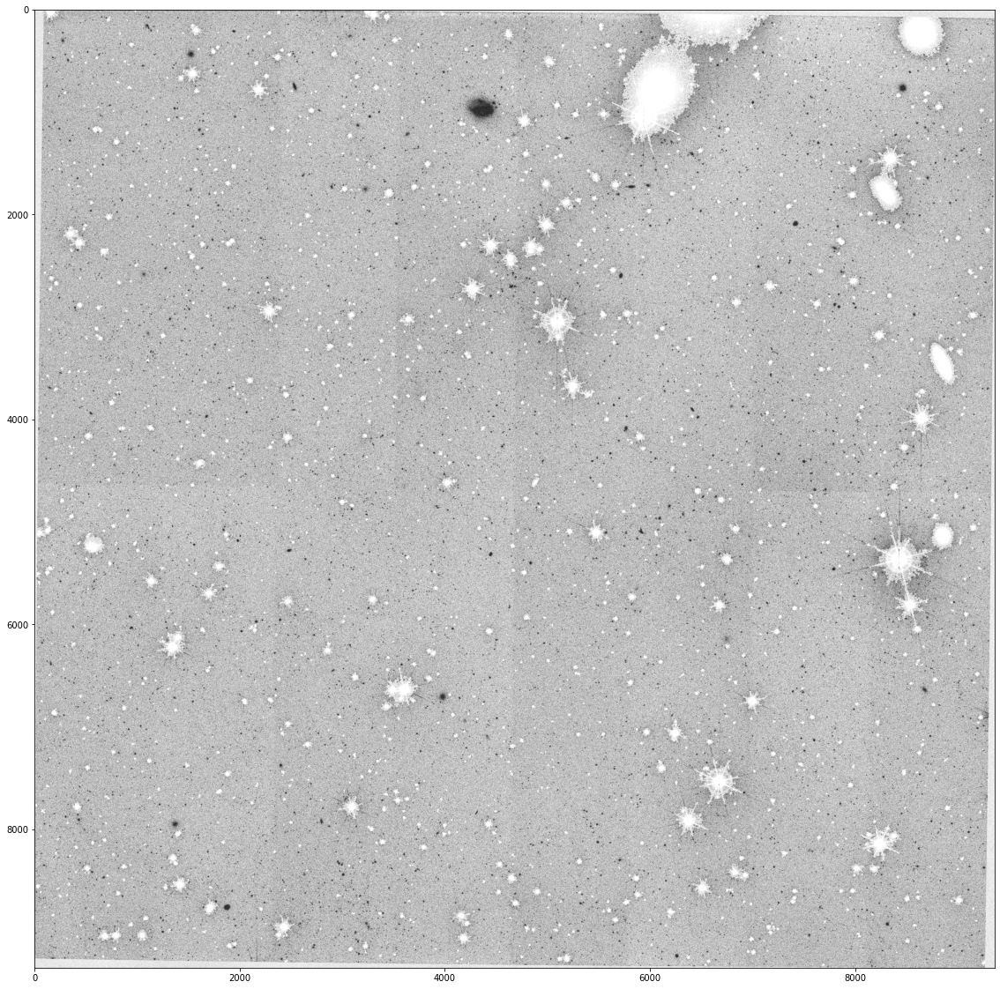

In [20]:
fig,ax = plt.subplots(figsize=(20,20))
stretched = np.arcsinh((10*data[1][:,:,1]*mask)/3)
plt.imshow(stretched , cmap='gray_r');
plt.imsave(fname='data/images/SPLUS-s28s34_band_r_masked_streched.png', arr= stretched, cmap='gray_r', format='png')

# Toy Example

In [22]:
import scipy.ndimage as ndimage
a = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 7, 0, 0, 0, 2, 0, 0, 0, 1],
       [0, 2, 1, 0, 0, 0, 0, 0, 3, 0],
       [0, 0, 0, 2, 0, 2, 1, 7, 2, 0],
       [0, 8, 0, 0, 0, 0, 0, 2, 0, 0],
       [2, 0, 0, 0, 0, 2, 0, 0, 0, 0],
       [0, 0, 0, 9, 0, 0, 0, 0, 0, 5],
       [0, 6, 0, 0, 1, 0, 0, 0, 1, 5],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

bright_pixels = np.where(a < 3, 0, a)
labeled_a,_ = ndimage.label(a)

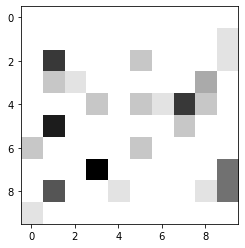

In [16]:
plt.imshow(a, cmap="gray_r")

In [24]:
labeled_a

array([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  1],
       [ 0,  2,  0,  0,  0,  3,  0,  0,  0,  1],
       [ 0,  2,  2,  0,  0,  0,  0,  0,  4,  0],
       [ 0,  0,  0,  5,  0,  4,  4,  4,  4,  0],
       [ 0,  6,  0,  0,  0,  0,  0,  4,  0,  0],
       [ 7,  0,  0,  0,  0,  8,  0,  0,  0,  0],
       [ 0,  0,  0,  9,  0,  0,  0,  0,  0, 10],
       [ 0, 11,  0,  0, 12,  0,  0,  0, 10, 10],
       [13,  0,  0,  0,  0,  0,  0,  0,  0,  0]], dtype=int32)

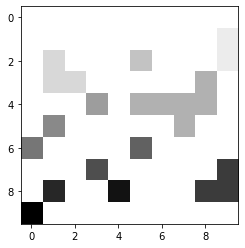

In [23]:
plt.imshow(labeled_a, cmap="gray_r")

# Coordinates Mess

In [13]:
def get_flags(file_path:str)->pd.DataFrame:
    col_list = ['ID','RA','DEC', 'BrightstarFlag']
    return pd.read_csv(file_path, usecols=col_list)

In [57]:
flags = get_flags("data/flags/SPLUS-s28s34_matches_masks_zspec.csv")
saturated = flags.query("BrightstarFlag == 2")

In [58]:
import astropy.wcs as wcs
from astropy.coordinates import SkyCoord
from astropy import units as u
f = fits.open('data/fits/SPLUS-s28s34_bands_RGI.fits')
w = wcs.WCS(f[0].header).dropaxis(2)

In [59]:
#Saturated objects
c_s = {}
for i in range(saturated.shape[0]):
    c_s[i] = SkyCoord(ra = saturated['RA'].values[i]*u.degree, dec = saturated['DEC'].values[i]*u.degree)

In [60]:
positions_s = np.zeros((saturated.shape[0], 2))
for i in range(saturated.shape[0]):
    positions_s[i] = w.world_to_pixel(c_s[i])

In [61]:
#Saving the saturated objects
d = np.array([positions_s[:, 0], positions_s[:, 1]]).T
columns = ['x', 'y']
df = pd.DataFrame(data = d, columns = columns)

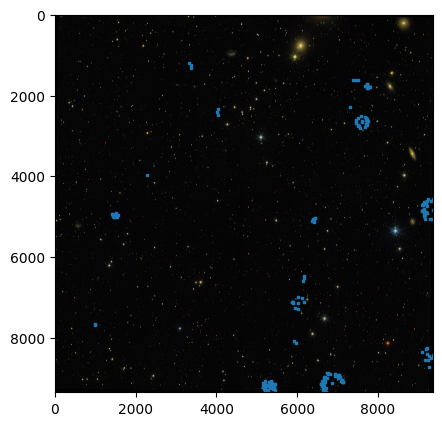

In [74]:
#Visualizing the saturated objects and its insiders
plt.figure(dpi = 100, figsize = (5, 5))
plt.scatter(positions_s[:, 0], positions_s[:, 1], marker = 's', s = 1, label = 'Saturated')
plt.imshow(data[1])

In [37]:
xp = positions_s[:, 0]
yp = positions_s[:, 1]

In [39]:
positions_s

array([[3176.4030639 ,  900.19398785],
       [3097.1229087 ,  903.44066725],
       [3044.54524447,  903.71983053],
       ...,
       [ 988.48015779, 7643.06338338],
       [1314.16739924, 7643.00304582],
       [5899.69027518, 7648.79351712]])

In [63]:
mask = np.histogram2d(xp, yp, bins = 190)[0]

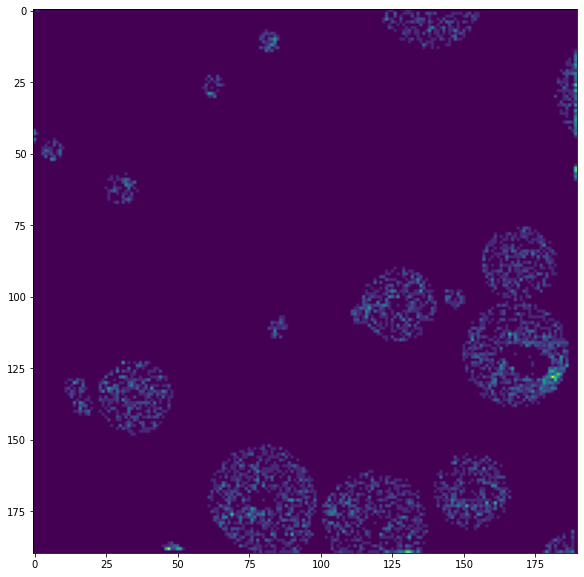

In [64]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(mask)

In [67]:
mask_res = cv.resize(mask, dsize=(10000, 10000), interpolation=cv.INTER_CUBIC)

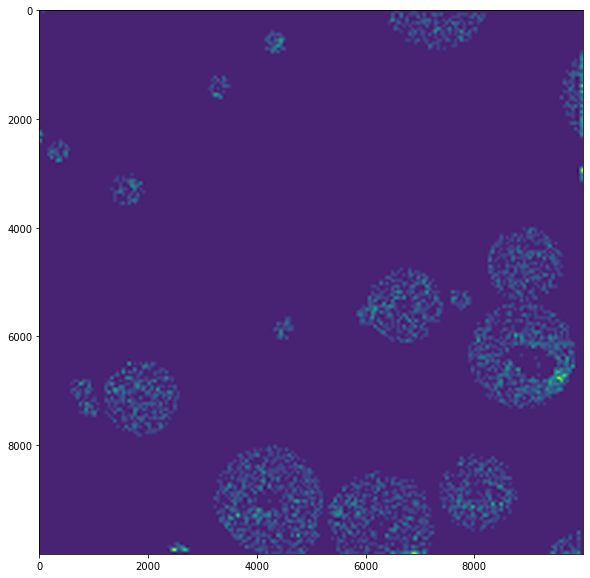

In [68]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(mask_res)

In [70]:
#It different object receives a label/value
labels, numobjects = scipy.ndimage.label(mask_res)

#Changing all nonzero values to one, to build the mask
original_mask = np.copy(labels)
original_mask[np.where(original_mask > 0)] = 1

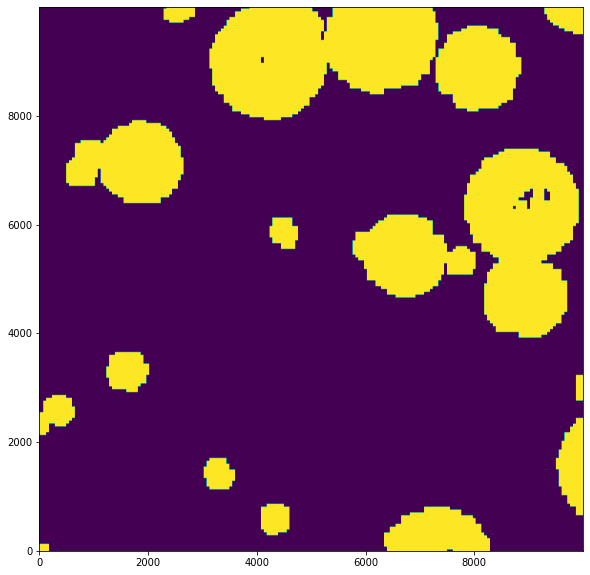

In [71]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(original_mask, origin='lower')

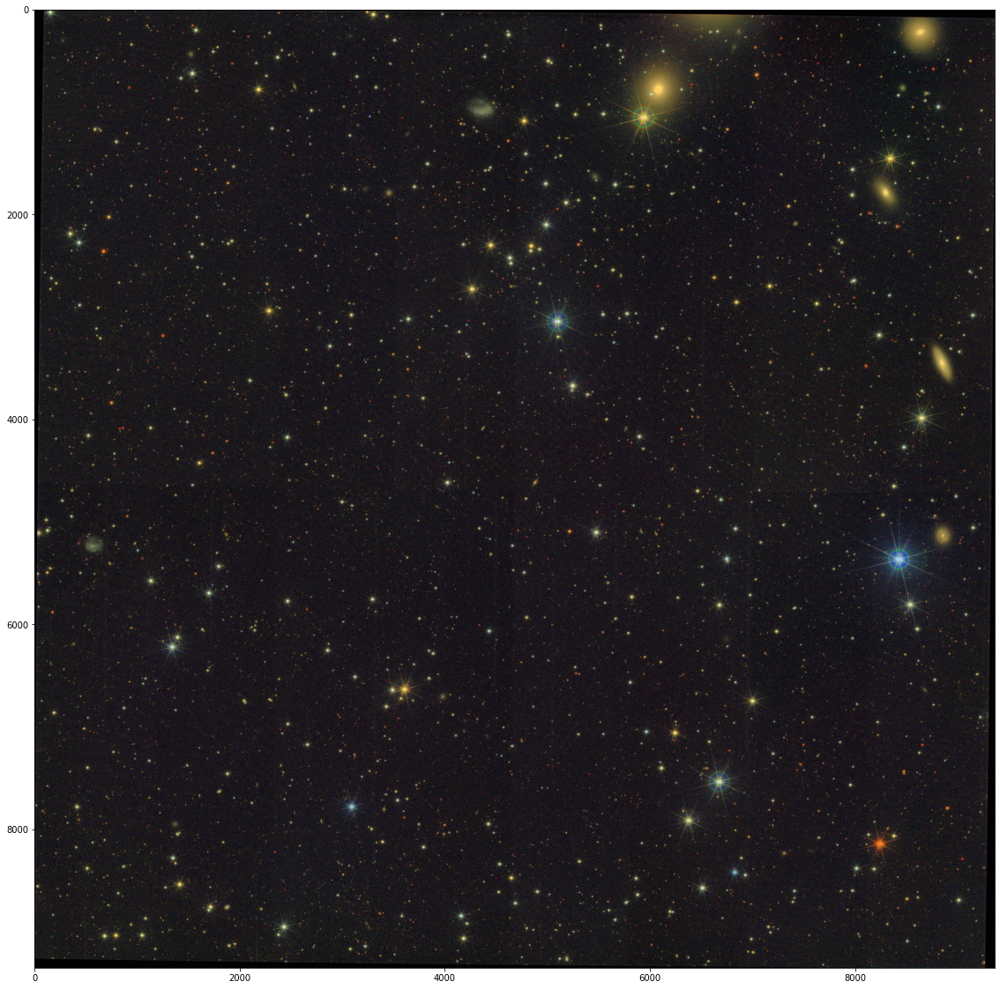

In [5]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(data[1])
#plt.imsave(fname='fornax.png', arr=data[1], cmap='gray_r', format='png')

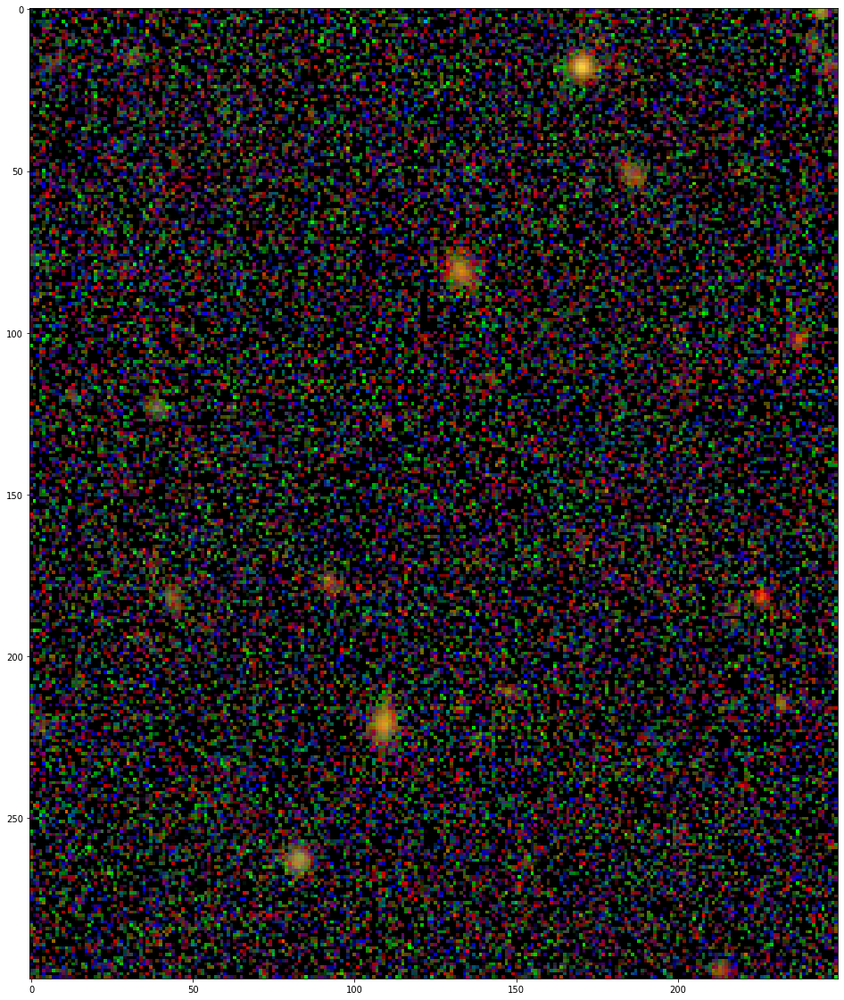

In [6]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(data[1][3300:3600,1500:1750])